## Análisis de accidentes - Buses

### Area metropolitana del Valle de Aburrá

Manuela Cordoba

Alejandro Fernandez

Ana María Jaramillo

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import config

In [2]:
loaded_cleaned_data = pd.read_excel(config.CLEANED_TRASNLATED_DATA)
loaded_cleaned_data

,case_number,period,geoco_type,severity,neighborhood,month,day,longitude,latitude,area_code,...,vehicle_class,service_type,brand,model,zone,design,driver_age,gender,weekday,hour
0,1739400,2021,road_network,injured,prado,2,25,-75.563376,6.263505,high_mix_use_areas_and_corridors,...,bus,public,modasa,2011,comuna_3,roundabout,45,male,thursday,14
1,1735512,2021,road_network,material_damage_only,el_progreso,1,14,-75.578933,6.271674,medium_mix_use_areas_and_corridors,...,automobile,private,mazda,2011,comuna_7,road_segment,30,male,thursday,18
2,1735512,2021,road_network,material_damage_only,el_progreso,1,14,-75.578933,6.271674,medium_mix_use_areas_and_corridors,...,bus,public,agrale,2008,comuna_7,road_segment,58,male,thursday,18
3,1735374,2021,road_network,material_damage_only,caribe,1,13,-75.575081,6.266311,high_mix_use_areas_and_corridors,...,automobile,private,renault,2017,comuna_7,road_segment,55,male,wednesday,19
4,1735374,2021,road_network,material_damage_only,caribe,1,13,-75.575081,6.266311,high_mix_use_areas_and_corridors,...,bus,public,chevrolet,2015,comuna_7,road_segment,30,male,wednesday,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79107,1470979,2014,approximate_road_network,material_damage_only,la_candelaria,12,31,-75.568715,6.247466,high_mix_use_areas_and_corridors,...,bus,public,daihatsu,2006,comuna_10,road_segment,49,male,wednesday,16
79108,1470984,2014,inverted_road_network_crossing,material_damage_only,la_candelaria,12,31,-75.564683,6.249282,high_mix_use_areas_and_corridors,...,automobile,public,hyundai,2014,comuna_10,road_segment,22,male,wednesday,13
79109,1470984,2014,inverted_road_network_crossing,material_damage_only,la_candelaria,12,31,-75.564683,6.249282,high_mix_use_areas_and_corridors,...,bus,public,modasa,2013,comuna_10,road_segment,41,male,wednesday,13
79110,1470985,2014,approximate_road_network,material_damage_only,los_mangos,12,31,-75.541845,6.249259,low_mix_use_areas,...,automobile,private,chevrolet,2009,comuna_8,cycle_route,41,male,wednesday,15


In [3]:
anselin_data = pd.read_excel(config.MORAN_ANSELIN_DATA)
anselin_data

,OBJECTID,Join_Count,TARGET_FID,case_numbe,longitude,latitude,severity,Weight_Sev,FREQUENCY,COUNT_case_numbe,...,NNeighbors_Anselin_Count,ZTransform_Anselin_Count,SpatialLag_Anselin_Count,LMiIndex_Anselin_Sev,LMiZScore_Anselin_Sev,LMiPValue_Anselin_Sev,COType_Anselin_Sev,NNeighbors_Anselin_Sev,ZTransform_Anselin_Sev,SpatialLag_Anselin_Sev
0,1,1,1,1423926,-75.576508,6.291228,injured,1,1,1,...,58.0,-0.018730,0.543881,0.582253,2.156081,0.014,LL,44.0,-1.827121,-0.319771
1,2,1,2,1423928,-75.575037,6.250175,injured,1,1,1,...,64.0,-0.171911,-0.078987,0.448096,3.615966,0.002,HH,43.0,0.780164,0.576343
2,3,1,3,1423988,-75.554314,6.263090,material_damage_only,3,1,1,...,76.0,-0.200892,0.080199,0.683349,3.255197,0.004,LL,44.0,-1.332783,-0.514491
3,4,1,4,1424000,-75.577322,6.213905,material_damage_only,3,2,2,...,66.0,11.043453,1.087238,0.770721,2.638864,0.004,HH,25.0,1.294009,0.597661
4,5,1,5,1424009,-75.560258,6.264596,material_damage_only,3,2,2,...,64.0,0.047511,0.825632,-0.023569,-0.710857,0.216,0,46.0,0.201719,-0.117243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41328,41329,1,41329,1739876,-75.582522,6.248546,material_damage_only,3,2,2,...,47.0,-0.229872,-0.135707,0.403800,3.023240,0.008,HH,42.0,0.806987,0.502105
41329,41330,1,41330,1739890,-75.562822,6.247261,injured,1,1,1,...,61.0,-0.163631,0.664080,0.311093,2.712888,0.006,HH,44.0,0.751173,0.415572
41330,41331,1,41331,1739934,-75.573665,6.275430,material_damage_only,3,2,2,...,59.0,0.134451,-0.007766,0.118755,2.632521,0.004,HH,48.0,0.299780,0.397507
41331,41332,1,41332,1739935,-75.558157,6.311913,material_damage_only,3,2,2,...,55.0,0.142732,0.631059,-0.074470,-0.861760,0.184,0,27.0,0.379012,-0.197163


In [4]:
anselin_data.columns

Index(['OBJECTID', 'Join_Count', 'TARGET_FID', 'case_numbe', 'longitude',
       'latitude', 'severity', 'Weight_Sev', 'FREQUENCY', 'COUNT_case_numbe',
       'neighborhood_code', 'neighborhood_name', 'neighborhood_id',
       'GiZScore_Count', 'GiPValue_Count', 'NNeighbors_Count', 'Gi_Bin_Count',
       'GiZScore_Severity', 'GiPValue_Severity', 'NNeighbors_Severity',
       'Gi_Bin_Severity', 'LMiIndex_Anselin_Count', 'LMiZScore_Anselin_Count',
       'LMiPValue_Anselin_Count', 'COType_Anselin_Count',
       'NNeighbors_Anselin_Count', 'ZTransform_Anselin_Count',
       'SpatialLag_Anselin_Count', 'LMiIndex_Anselin_Sev',
       'LMiZScore_Anselin_Sev', 'LMiPValue_Anselin_Sev', 'COType_Anselin_Sev',
       'NNeighbors_Anselin_Sev', 'ZTransform_Anselin_Sev',
       'SpatialLag_Anselin_Sev'],
      dtype='object')

In [5]:
# Remover columnas innecesarias 
anselin_data = anselin_data.drop(columns=['OBJECTID', 'Join_Count', 'TARGET_FID','longitude', 
                                          'latitude', 'severity', 'Weight_Sev', 'FREQUENCY', 'COUNT_case_numbe',
                                          'neighborhood_code', 'neighborhood_name', 'neighborhood_id'])
anselin_data

,case_numbe,GiZScore_Count,GiPValue_Count,NNeighbors_Count,Gi_Bin_Count,GiZScore_Severity,GiPValue_Severity,NNeighbors_Severity,Gi_Bin_Severity,LMiIndex_Anselin_Count,...,NNeighbors_Anselin_Count,ZTransform_Anselin_Count,SpatialLag_Anselin_Count,LMiIndex_Anselin_Sev,LMiZScore_Anselin_Sev,LMiPValue_Anselin_Sev,COType_Anselin_Sev,NNeighbors_Anselin_Sev,ZTransform_Anselin_Sev,SpatialLag_Anselin_Sev
0,1423926,-0.044562,9.644564e-01,63.0,0.0,-2.248732,0.024530,45.0,-2.0,-0.010156,...,58.0,-0.018730,0.543881,0.582253,2.156081,0.014,LL,44.0,-1.827121,-0.319771
1,1423928,7.714763,0.000000e+00,61.0,3.0,3.439327,0.000583,44.0,3.0,0.013538,...,64.0,-0.171911,-0.078987,0.448096,3.615966,0.002,HH,43.0,0.780164,0.576343
2,1423988,4.789657,1.670669e-06,60.0,3.0,-3.271693,0.001069,45.0,-3.0,-0.016063,...,76.0,-0.200892,0.080199,0.683349,3.255197,0.004,LL,44.0,-1.332783,-0.514491
3,1424000,0.764648,4.444812e-01,37.0,0.0,3.275918,0.001053,26.0,3.0,11.970702,...,66.0,11.043453,1.087238,0.770721,2.638864,0.004,HH,25.0,1.294009,0.597661
4,1424009,5.551551,2.831457e-08,69.0,3.0,-0.939343,0.347555,47.0,0.0,0.039108,...,64.0,0.047511,0.825632,-0.023569,-0.710857,0.216,0,46.0,0.201719,-0.117243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41328,1739876,6.942926,3.840616e-12,66.0,3.0,3.196617,0.001390,43.0,3.0,0.031101,...,47.0,-0.229872,-0.135707,0.403800,3.023240,0.008,HH,42.0,0.806987,0.502105
41329,1739890,7.351307,0.000000e+00,67.0,3.0,2.667819,0.007635,45.0,3.0,-0.108337,...,61.0,-0.163631,0.664080,0.311093,2.712888,0.006,HH,44.0,0.751173,0.415572
41330,1739934,3.491899,4.795993e-04,70.0,3.0,1.758349,0.078688,49.0,1.0,-0.001041,...,59.0,0.134451,-0.007766,0.118755,2.632521,0.004,HH,48.0,0.299780,0.397507
41331,1739935,-0.780243,4.352479e-01,41.0,0.0,-1.594513,0.110821,28.0,0.0,0.089801,...,55.0,0.142732,0.631059,-0.074470,-0.861760,0.184,0,27.0,0.379012,-0.197163


In [6]:
joined_data = loaded_cleaned_data.merge(
    anselin_data, left_on="case_number", right_on="case_numbe"
)
print("Shape of joined_data: ", joined_data.shape)
joined_data.tail()

Shape of joined_data:  (79112, 50)


,case_number,period,geoco_type,severity,neighborhood,month,day,longitude,latitude,area_code,...,NNeighbors_Anselin_Count,ZTransform_Anselin_Count,SpatialLag_Anselin_Count,LMiIndex_Anselin_Sev,LMiZScore_Anselin_Sev,LMiPValue_Anselin_Sev,COType_Anselin_Sev,NNeighbors_Anselin_Sev,ZTransform_Anselin_Sev,SpatialLag_Anselin_Sev
79107,1470979,2014,approximate_road_network,material_damage_only,la_candelaria,12,31,-75.568715,6.247466,high_mix_use_areas_and_corridors,...,61.0,-0.163631,0.664080,0.311093,2.712888,0.006,HH,44.0,0.751173,0.415572
79108,1470984,2014,inverted_road_network_crossing,material_damage_only,la_candelaria,12,31,-75.564683,6.249282,high_mix_use_areas_and_corridors,...,61.0,-0.163631,0.664080,0.311093,2.712888,0.006,HH,44.0,0.751173,0.415572
79109,1470984,2014,inverted_road_network_crossing,material_damage_only,la_candelaria,12,31,-75.564683,6.249282,high_mix_use_areas_and_corridors,...,61.0,-0.163631,0.664080,0.311093,2.712888,0.006,HH,44.0,0.751173,0.415572
79110,1470985,2014,approximate_road_network,material_damage_only,los_mangos,12,31,-75.541845,6.249259,low_mix_use_areas,...,66.0,-0.014590,0.111999,0.018643,2.667649,0.006,LL,35.0,-0.040150,-0.465942
79111,1470985,2014,approximate_road_network,material_damage_only,los_mangos,12,31,-75.541845,6.249259,low_mix_use_areas,...,66.0,-0.014590,0.111999,0.018643,2.667649,0.006,LL,35.0,-0.040150,-0.465942


In [7]:
joined_data.columns

Index(['case_number', 'period', 'geoco_type', 'severity', 'neighborhood',
       'month', 'day', 'longitude', 'latitude', 'area_code',
       'user_category_code', 'subcategory_code', 'subcategory', 'hierarchy',
       'road_class', 'stratum', 'accident_type', 'vehicle_class',
       'service_type', 'brand', 'model', 'zone', 'design', 'driver_age',
       'gender', 'weekday', 'hour', 'case_numbe', 'GiZScore_Count',
       'GiPValue_Count', 'NNeighbors_Count', 'Gi_Bin_Count',
       'GiZScore_Severity', 'GiPValue_Severity', 'NNeighbors_Severity',
       'Gi_Bin_Severity', 'LMiIndex_Anselin_Count', 'LMiZScore_Anselin_Count',
       'LMiPValue_Anselin_Count', 'COType_Anselin_Count',
       'NNeighbors_Anselin_Count', 'ZTransform_Anselin_Count',
       'SpatialLag_Anselin_Count', 'LMiIndex_Anselin_Sev',
       'LMiZScore_Anselin_Sev', 'LMiPValue_Anselin_Sev', 'COType_Anselin_Sev',
       'NNeighbors_Anselin_Sev', 'ZTransform_Anselin_Sev',
       'SpatialLag_Anselin_Sev'],
      dtype='obje

### Notas importantes: 
mes: se esta tomando numérico
día: se está tomando numérico

## Delete features with correlation aprox 1 (>0.9)

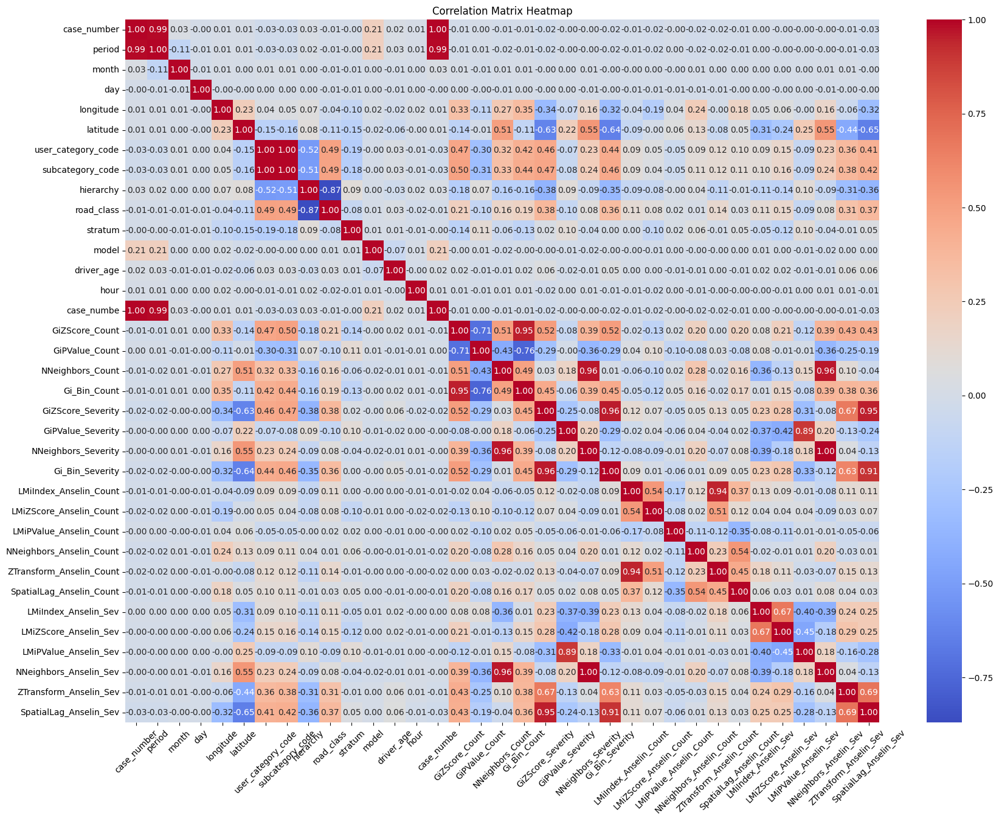

In [8]:
# Select only numeric columns from joined_data
numeric_data = joined_data.select_dtypes(include=[float, int])

# Create a correlation matrix using only numeric data
correlation_matrix = numeric_data.corr()


# Set up the Matplotlib figure
plt.figure(figsize=(20, 15))

# Create a heatmap using Seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

# Customize the plot (optional)
plt.title("Correlation Matrix Heatmap")
plt.xticks(rotation=45)
plt.show()

In [9]:
numeric_data.columns

Index(['case_number', 'period', 'month', 'day', 'longitude', 'latitude',
       'user_category_code', 'subcategory_code', 'hierarchy', 'road_class',
       'stratum', 'model', 'driver_age', 'hour', 'case_numbe',
       'GiZScore_Count', 'GiPValue_Count', 'NNeighbors_Count', 'Gi_Bin_Count',
       'GiZScore_Severity', 'GiPValue_Severity', 'NNeighbors_Severity',
       'Gi_Bin_Severity', 'LMiIndex_Anselin_Count', 'LMiZScore_Anselin_Count',
       'LMiPValue_Anselin_Count', 'NNeighbors_Anselin_Count',
       'ZTransform_Anselin_Count', 'SpatialLag_Anselin_Count',
       'LMiIndex_Anselin_Sev', 'LMiZScore_Anselin_Sev',
       'LMiPValue_Anselin_Sev', 'NNeighbors_Anselin_Sev',
       'ZTransform_Anselin_Sev', 'SpatialLag_Anselin_Sev'],
      dtype='object')

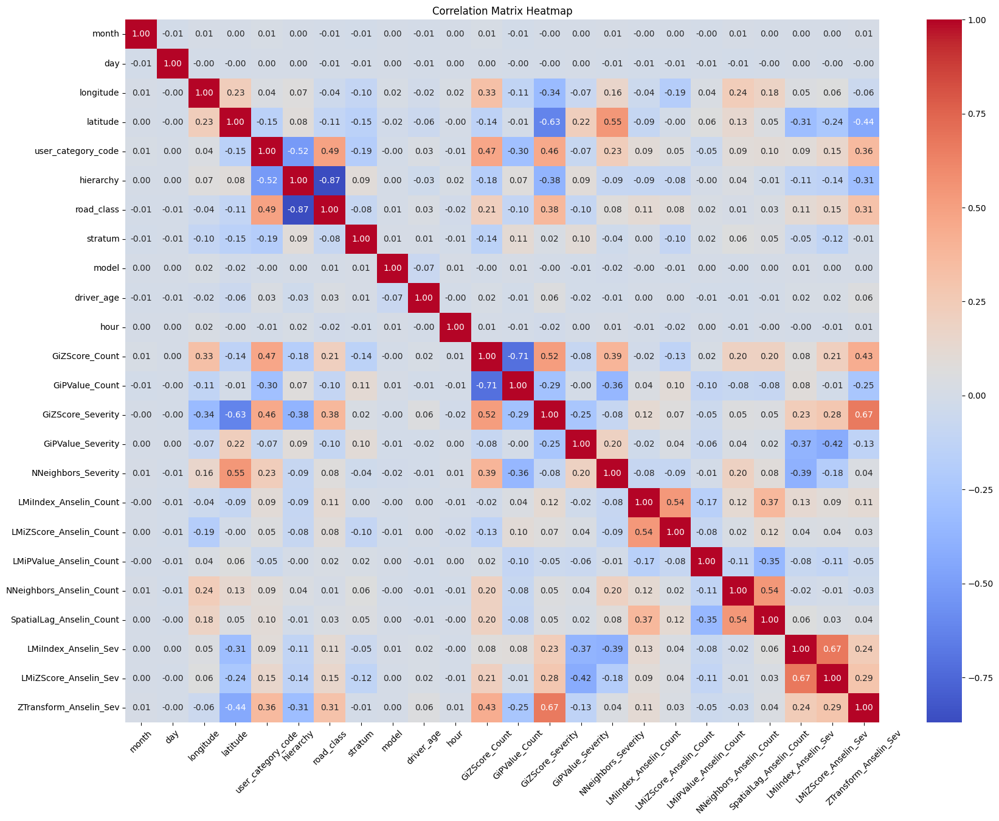

In [10]:
# Column case_number and case_numbe are the key for the join, therefore we delete both.
columns_to_remove = ['case_numbe', 'case_number', 'period', 'subcategory_code','NNeighbors_Count',
                     'Gi_Bin_Count', 'Gi_Bin_Severity', 'ZTransform_Anselin_Count', 'LMiPValue_Anselin_Sev', 
                     'NNeighbors_Anselin_Sev', 'SpatialLag_Anselin_Sev']

# Remove specified columns
numeric_data = numeric_data.drop(columns=columns_to_remove)

# Create a correlation matrix
correlation_matrix = numeric_data.corr()

# Set up the Matplotlib figure
plt.figure(figsize=(20, 15))

# Create a heatmap using Seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

# Customize the plot (optional)
plt.title("Correlation Matrix Heatmap")
plt.xticks(rotation=45)
plt.show()

## Get dummies

In [11]:
non_numeric_data = joined_data.select_dtypes(exclude=[float, int])

In [12]:
non_numeric_data.columns

Index(['geoco_type', 'severity', 'neighborhood', 'area_code', 'subcategory',
       'accident_type', 'vehicle_class', 'service_type', 'brand', 'zone',
       'design', 'gender', 'weekday', 'COType_Anselin_Count',
       'COType_Anselin_Sev'],
      dtype='object')

In [13]:
categorical_columns = ['geoco_type', 'severity', 'neighborhood', 'area_code', 'subcategory',
                       'accident_type', 'vehicle_class', 'service_type', 'brand', 'zone',
                       'design', 'gender', 'weekday', 'COType_Anselin_Count',
                       'COType_Anselin_Sev']
non_numeric_data_encoded = pd.get_dummies(non_numeric_data, columns=categorical_columns)

In [14]:
non_numeric_data_encoded

,geoco_type_approximate_road_network,geoco_type_epm_with_interior,geoco_type_epm_without_interior,geoco_type_inverted_road_network_crossing,geoco_type_nomenclature_with_interior,geoco_type_not_located,geoco_type_road_network,geoco_type_rural_area,severity_fatality,severity_injured,...,COType_Anselin_Count_0,COType_Anselin_Count_HH,COType_Anselin_Count_HL,COType_Anselin_Count_LH,COType_Anselin_Count_LL,COType_Anselin_Sev_0,COType_Anselin_Sev_HH,COType_Anselin_Sev_HL,COType_Anselin_Sev_LH,COType_Anselin_Sev_LL
0,0,0,0,0,0,0,1,0,0,1,...,1,0,0,0,0,1,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,1,0,0,0
2,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79107,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
79108,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
79109,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
79110,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1


In [15]:
#'''
# Create a correlation matrix
correlation_matrix_encoded = non_numeric_data_encoded.corr()

# Set up the Matplotlib figure
plt.figure(figsize=(300, 300))

# Create a heatmap using Seaborn
sns.heatmap(correlation_matrix_encoded, annot=True, cmap='coolwarm', fmt=".2f")

# Customize the plot (optional)
plt.title("Correlation Matrix Heatmap")
plt.xticks(rotation=45)
plt.show()
#'''

In [16]:
# Filter the correlation matrix to get pairs with correlation greater than 0.8
high_correlation_pairs = (correlation_matrix_encoded.abs() > 0.8) & (correlation_matrix_encoded.abs() < 1)

correlation_matrix_encoded.abs()

# Get the names of variables with high correlation
high_correlation_variables = set()
for i in range(len(high_correlation_pairs.columns)):
    for j in range(i):
        if high_correlation_pairs.iloc[i, j]:
            variable_i = high_correlation_pairs.columns[i]
            variable_j = high_correlation_pairs.columns[j]
            high_correlation_variables.add((variable_i, variable_j))

print("Variables with correlation greater than 0.8:")
for pair in high_correlation_variables:
    print(pair)

Variables with correlation greater than 0.8:
('severity_material_damage_only', 'severity_injured')
('design_road_segment', 'design_intersection')
('gender_male', 'gender_female')
('service_type_public', 'service_type_private')


After the revision of correlated columns in the cases of cathegorical variables, we can see that for the binary variables the existence of one is highly correlated to the presence of the other one (exactly what binary means), therefore we wil not delete those. 

For the correlation the dataset was analyzed in two different representations: not-encoded and encoded. 

The not-encoded dataset it the joined_data without the columns-to-remove.
The encoded dataset is the same one with the dummies of the cathegorical ones. 

In [17]:
joined_data_not_correlated = joined_data.drop(columns=columns_to_remove)
joined_data_not_correlated

,geoco_type,severity,neighborhood,month,day,longitude,latitude,area_code,user_category_code,subcategory,...,LMiIndex_Anselin_Count,LMiZScore_Anselin_Count,LMiPValue_Anselin_Count,COType_Anselin_Count,NNeighbors_Anselin_Count,SpatialLag_Anselin_Count,LMiIndex_Anselin_Sev,LMiZScore_Anselin_Sev,COType_Anselin_Sev,ZTransform_Anselin_Sev
0,road_network,injured,prado,2,25,-75.563376,6.263505,high_mix_use_areas_and_corridors,3,centralities_with_economic_predominance,...,0.007202,0.464686,0.332,0,51.0,-0.068365,-0.004177,-0.090220,0,0.235915
1,road_network,material_damage_only,el_progreso,1,14,-75.578933,6.271674,medium_mix_use_areas_and_corridors,2,transition_zones_centralities_endowment_areas_...,...,0.085740,3.966521,0.008,HH,54.0,0.639631,0.551312,3.141803,HH,1.188109
2,road_network,material_damage_only,el_progreso,1,14,-75.578933,6.271674,medium_mix_use_areas_and_corridors,2,transition_zones_centralities_endowment_areas_...,...,0.085740,3.966521,0.008,HH,54.0,0.639631,0.551312,3.141803,HH,1.188109
3,road_network,material_damage_only,caribe,1,13,-75.575081,6.266311,high_mix_use_areas_and_corridors,3,economically_transforming_areas,...,-0.089343,-0.945230,0.150,0,34.0,0.194088,0.328677,2.525698,HH,0.887363
4,road_network,material_damage_only,caribe,1,13,-75.575081,6.266311,high_mix_use_areas_and_corridors,3,economically_transforming_areas,...,-0.089343,-0.945230,0.150,0,34.0,0.194088,0.328677,2.525698,HH,0.887363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79107,approximate_road_network,material_damage_only,la_candelaria,12,31,-75.568715,6.247466,high_mix_use_areas_and_corridors,3,centralities_with_economic_predominance,...,-0.108337,-5.327649,0.002,LH,61.0,0.664080,0.311093,2.712888,HH,0.751173
79108,inverted_road_network_crossing,material_damage_only,la_candelaria,12,31,-75.564683,6.249282,high_mix_use_areas_and_corridors,3,centralities_with_economic_predominance,...,-0.108337,-5.327649,0.002,LH,61.0,0.664080,0.311093,2.712888,HH,0.751173
79109,inverted_road_network_crossing,material_damage_only,la_candelaria,12,31,-75.564683,6.249282,high_mix_use_areas_and_corridors,3,centralities_with_economic_predominance,...,-0.108337,-5.327649,0.002,LH,61.0,0.664080,0.311093,2.712888,HH,0.751173
79110,approximate_road_network,material_damage_only,los_mangos,12,31,-75.541845,6.249259,low_mix_use_areas,1,predominantly_residential_areas,...,-0.001629,-0.656907,0.184,0,66.0,0.111999,0.018643,2.667649,LL,-0.040150


Now we have to review the variations that each variable has to validate that the values considered make sense. 

In [18]:
print(joined_data_not_correlated.columns)
columns_joined_data_not_correlated = joined_data_not_correlated.columns.tolist()

Index(['geoco_type', 'severity', 'neighborhood', 'month', 'day', 'longitude',
       'latitude', 'area_code', 'user_category_code', 'subcategory',
       'hierarchy', 'road_class', 'stratum', 'accident_type', 'vehicle_class',
       'service_type', 'brand', 'model', 'zone', 'design', 'driver_age',
       'gender', 'weekday', 'hour', 'GiZScore_Count', 'GiPValue_Count',
       'GiZScore_Severity', 'GiPValue_Severity', 'NNeighbors_Severity',
       'LMiIndex_Anselin_Count', 'LMiZScore_Anselin_Count',
       'LMiPValue_Anselin_Count', 'COType_Anselin_Count',
       'NNeighbors_Anselin_Count', 'SpatialLag_Anselin_Count',
       'LMiIndex_Anselin_Sev', 'LMiZScore_Anselin_Sev', 'COType_Anselin_Sev',
       'ZTransform_Anselin_Sev'],
      dtype='object')


In [19]:
joined_data_not_correlated[columns_joined_data_not_correlated[0]].value_counts()

road_network                      60880
approximate_road_network          10990
inverted_road_network_crossing     3995
epm_without_interior               2232
epm_with_interior                   895
nomenclature_with_interior           64
not_located                          44
rural_area                           12
Name: geoco_type, dtype: int64

In [20]:
joined_data_not_correlated[columns_joined_data_not_correlated[1]].value_counts()

material_damage_only    59537
injured                 19454
fatality                  121
Name: severity, dtype: int64

In [21]:
joined_data_not_correlated[columns_joined_data_not_correlated[2]].value_counts()

la_candelaria    5290
colon            3338
guayaquil        2842
san_benito       2256
villa_nueva      1878
                 ... 
1101                1
205                 1
villa_lilliam       1
409                 1
1003                1
Name: neighborhood, Length: 338, dtype: int64

### neighborhood 
is a very spread variable with 338 possible values 

In [22]:
len(joined_data_not_correlated[columns_joined_data_not_correlated[4]].unique())

31

In [23]:
len(joined_data_not_correlated[columns_joined_data_not_correlated[5]].unique())

9860

In [24]:
len(joined_data_not_correlated[columns_joined_data_not_correlated[6]].unique())

9913

In [25]:
joined_data_not_correlated[columns_joined_data_not_correlated[10]].value_counts()

5.0    32718
3.0    31763
4.0    11189
1.0     2715
4.2      152
3.8      150
4.6      106
3.4      102
3.6       46
4.4       46
4.8       35
3.2       34
2.0       26
2.6       13
2.2        7
2.4        4
1.4        3
2.8        3
Name: hierarchy, dtype: int64

In [26]:
joined_data_not_correlated[columns_joined_data_not_correlated[11]].value_counts()

1.0    44732
6.0    32395
5.0      944
3.0      659
4.0      169
2.0      168
3.8       11
2.8        6
3.6        5
1.8        4
1.4        3
4.6        3
3.4        2
4.8        2
5.6        2
2.6        2
4.4        1
3.2        1
4.2        1
5.8        1
2.4        1
Name: road_class, dtype: int64

In [27]:
joined_data_not_correlated[columns_joined_data_not_correlated[17]].value_counts()

2014    8366
2013    6303
2007    5793
2011    5774
2008    5681
        ... 
1606       1
2022       1
1612       1
1206       1
1947       1
Name: model, Length: 80, dtype: int64

In [28]:
n = 27
print(len(joined_data_not_correlated[columns_joined_data_not_correlated[n]].unique()))
joined_data_not_correlated[columns_joined_data_not_correlated[n]].value_counts()


283


0.007635    5265
0.004830    3349
0.000583    2903
0.000073    2602
0.000739    1737
            ... 
0.516448       2
0.005642       2
0.002828       2
0.000002       2
0.070780       2
Name: GiPValue_Severity, Length: 282, dtype: int64

## Here we will delete the highly spread variables: 

In [29]:
joined_data_not_correlated = joined_data_not_correlated.drop(columns=['neighborhood', 'longitude', 'latitude'])

## Save resulting dataset 

In [30]:
joined_data_not_correlated.to_csv(config.DATASET_WITH_SPATIAL_INFO, index=False)